# Przetwarzanie wstępne. Filtracja kontekstowa.


### Cel:
- zapoznanie z pojęciem kontekstu / filtracji kontekstowej,
- zapoznanie z pojęciem konwolucji (splotu),
- zapoznanie z wybranymi filtrami:
	- filtry liniowe dolnoprzepustowe:
		- filtr uśredniający,
		- filtr Gaussa.
	- filtry nielinowe:
		- mediana,
		- mediana dla obrazów kolorowych.
	- filtry liniowe górnoprzepustowe:
			- laplasjan,
			- operator Robersta, Prewitta, Sobela.
- zadanie domowe: adaptacyjna filtracja medianowa.

### Filtry liniowe uśredniające (dolnoprzepustowe)

Jest to podstawowa rodzina filtrów stosowana w cyfrowym przetwarzaniu obrazów. 
Wykorzystuje się je w celu "rozmazania" obrazu i tym samym redukcji szumów (zakłóceń) na obrazie.
Filtr określony jest przez dwa parametry: rozmiar maski (ang. _kernel_) oraz wartości współczynników maski.

Warto zwrócić uwagę, że omawiane w niniejszym rozdziale operacje generują nową wartość piksela na podstawie pewnego fragmentu obrazu (tj. kontekstu), a nie jak operacje punktowe tylko na podstawie jednego piksela.


1. Wczytaj obraz _plansza.png_.
W dalszej części ćwiczenia sprawdzenie działania filtracji dla innych obrazów sprowadzi się do wczytania innego pliku.

2. Podstawowa funkcja to `cv2.filter2D`  - realizacja filtracji konwolucyjnej.
   Proszę sprawdzić jej dokumentację i zwrócić uwagę na obsługę problemu brzegowego (na krawędziach istnieją piksele dla których nie da się wyznaczyć otoczenia).

  Uwaga. Problem ten można też rozwiązać z użyciem funkcji `signal.convolve2d` z biblioteki _scipy_ (`from scipy import signal`).

3. Stwórz podstawowy filtr uśredniający o rozmiarze $3 \times 3$ -- za pomocą funkcji `np.ones`. Wykonaj konwolucję na wczytanym obrazie. Na wspólnym rysunku wyświetl obraz oryginalny, po filtracji oraz moduł z różnicy.

4. Przeanalizuj otrzymane wyniki. Jakie elementy zawiera obraz "moduł z różnicy"? Co na tej podstawie można powiedzieć o filtracji dolnoprzepustowej?

In [89]:
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
from scipy import signal
%matplotlib inline

# Obrazki
if not os.path.exists("jet.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/jet.png --no-check-certificate
if not os.path.exists("kw.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/kw.png --no-check-certificate
if not os.path.exists("moon.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/moon.png --no-check-certificate
if not os.path.exists("lenaSzum.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/lenaSzum.png --no-check-certificate
if not os.path.exists("lena.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/lena.png --no-check-certificate
if not os.path.exists("plansza.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/plansza.png --no-check-certificate





In [90]:
def filtr_sred(img,kernel_size):
    kernel =np.ones((kernel_size,kernel_size))/(kernel_size*kernel_size)
    dst = cv2.filter2D(img, -1, kernel)
    return dst

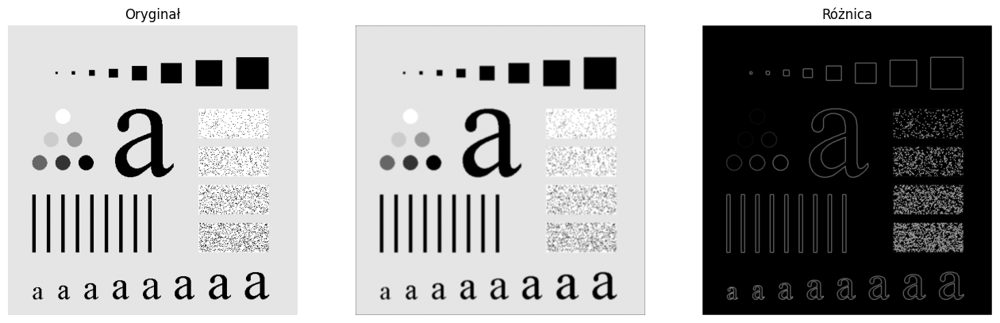

In [91]:
plansza = cv2.imread("plansza.png", cv2.IMREAD_GRAYSCALE)
f, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(16,6))
ax1.set_title("Oryginał")
ax1.imshow(plansza, 'gray')
ax1.axis('off')
kernel_1 =np.ones((3,3))/(3*3)
dst=signal.convolve2d(plansza,kernel_1,mode='same')
ax3.set_title("Po filtracji")
ax2.imshow(dst, 'gray')
ax2.axis('off')
diff=np.abs(plansza-dst)
ax3.set_title("Różnica")
ax3.imshow(diff, 'gray')
ax3.axis('off')
plt.show()

5. Na wspólnym rysunku wyświetl wyniki filtracji uśredniającej z oknem o rozmiarze 3, 5, 9, 15 i 35. 
Wykorzystaj polecenie `plt.subplot`. 
Przeanalizuj wpływ rozmiaru maski na wynik. 

(np.float64(-0.5), np.float64(499.5), np.float64(499.5), np.float64(-0.5))

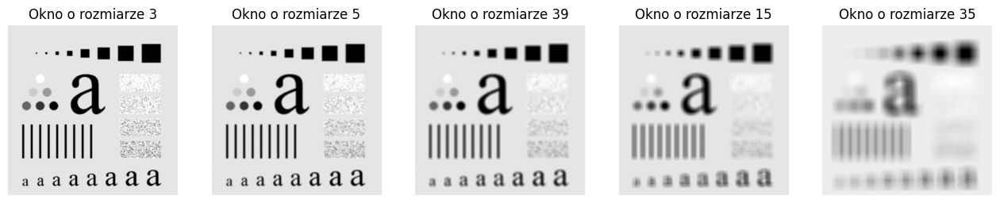

In [92]:
f, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(1,5,figsize=(16,6))
I3=filtr_sred(plansza,3)
I5=filtr_sred(plansza,5)
I9=filtr_sred(plansza,9)
I15=filtr_sred(plansza,15)
I35=filtr_sred(plansza,35)

ax1.imshow(I3, 'gray')
ax1.set_title("Okno o rozmiarze 3")
ax1.axis('off')
ax2.imshow(I5, 'gray')
ax2.set_title("Okno o rozmiarze 5")
ax2.axis('off')
ax3.imshow(I9, 'gray')
ax3.set_title("Okno o rozmiarze 39")
ax3.axis('off')
ax4.imshow(I15, 'gray')
ax4.set_title("Okno o rozmiarze 15")
ax4.axis('off')
ax5.imshow(I35, 'gray')
ax5.set_title("Okno o rozmiarze 35")
ax5.axis('off')

6. Wczytaj obraz _lena.png_.
Zaobserwuj efekty filtracji dolnoprzepustowej dla obrazu rzeczywistego.

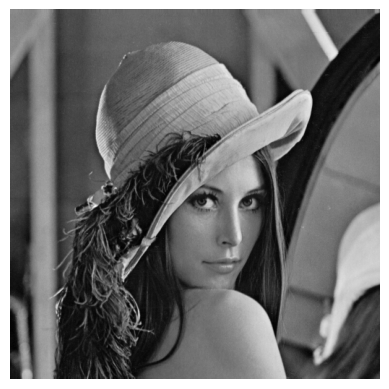

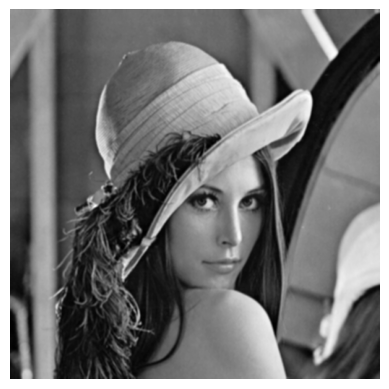

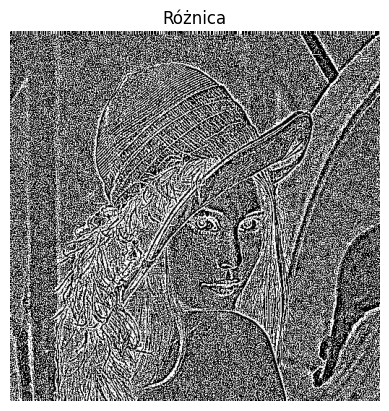

In [93]:
lena = cv2.imread("lena.png", cv2.IMREAD_GRAYSCALE)
plt.imshow(lena, 'gray')
plt.axis('off')
plt.show()

lena_filtr=filtr_sred(lena,3)
plt.imshow(lena_filtr, 'gray')
plt.axis('off')
plt.show()

diff=np.abs(lena-lena_filtr)
plt.title("Różnica")
plt.imshow(diff, 'gray')
plt.axis('off')
plt.show()

7. Niekorzystny efekt towarzyszący wykonanym filtracjom dolnoprzepustowym to utrata ostrości. 
Częściowo można go zniwelować poprzez odpowiedni dobór maski. 
Wykorzystaj maskę:  `M = np.array([1 2 1; 2 4 2; 1 2 1])`. 
Przed obliczeniami należy jeszcze wykonać normalizację - podzielić każdy element maski przez sumę wszystkich elementów: `M = M/sum(sum(M));`.
Tak przygotowaną maskę wykorzystaj w konwolucji - wyświetl wyniki tak jak wcześniej.
Możliwe jest też wykorzystywanie innych masek - współczynniki można dopasowywać do konkretnego problemu.

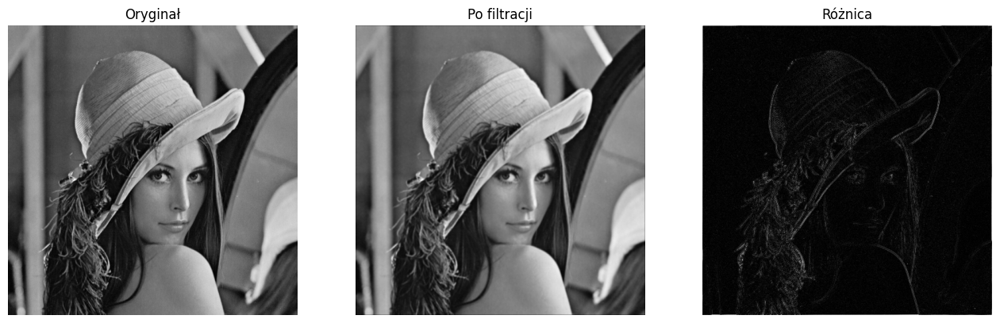

In [94]:
M = np.array([[1,2,1],[2,4,2],[1,2,1]])
M = M/sum(sum(M));

f, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(16,6))
ax1.set_title("Oryginał")
ax1.imshow(lena, 'gray')
ax1.axis('off')
dst=signal.convolve2d(lena,M,mode='same')
ax2.set_title("Po filtracji")
ax2.imshow(dst, 'gray')
ax2.axis('off')
diff=np.abs(lena-dst)
ax3.set_title("Różnica")
ax3.imshow(diff, 'gray')
ax3.axis('off')
plt.show()

8. Skuteczną i często wykorzystywaną maską jest tzw. maska Gasussa.
Jest to zbiór liczb, które aproksymują dwuwymiarowy rozkład Gaussa. 
Parametrem jest odchylenie standardowe i rozmiar maski.

9. Wykorzystując przygotowaną funkcję `fgaussian` stwórz maskę o rozmiarze $5 \times 5$ i odchyleniu standardowym 0.5.
  Wykorzystując funkcję `mesh` zwizualizuj filtr.
  Sprawdź jak parametr ``odchylenie standardowe'' wpływa na ``kształt'' filtru.

  Uwaga. W OpenCV dostępna jest *dedykowana* funkcja do filtracji Gaussa - `GaussianBlur`.
  Proszę na jednym przykładzie porównać jej działanie z użytym wyżej rozwiązaniem.

10. Wykonaj filtrację dla wybranych (2-3) wartości odchylenia standardowego.


In [95]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def fgaussian(size, sigma):
    m = n = size
    h, k = m // 2, n // 2
    x, y = np.mgrid[-h:h, -k:k]
    g = np.exp(-(x**2 + y**2) / (2 * sigma**2))
    return g / g.sum()

def mesh(fun, size):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    
    X = np.linspace(-size // 2, size // 2, fun.shape[0])
    Y = np.linspace(-size // 2, size // 2, fun.shape[1])
    X, Y = np.meshgrid(X, Y)
    Z = fun
    
    ax.plot_surface(X, Y, Z, cmap='viridis')
    
    plt.show()

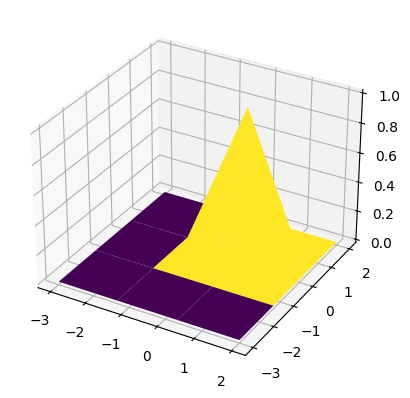

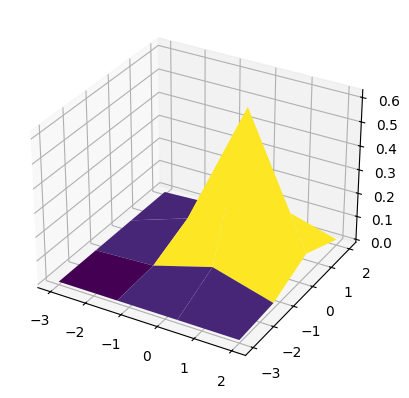

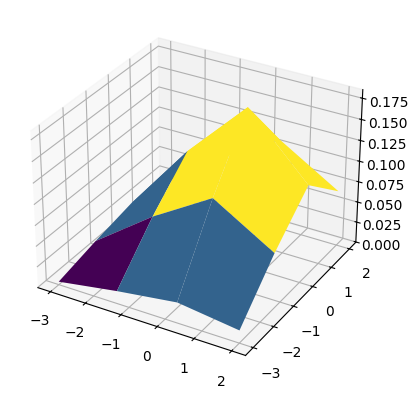

In [96]:
maska = fgaussian(5,0.1)
mesh(maska,5)
maska = fgaussian(5,0.5)
mesh(maska,5)
maska = fgaussian(5,1)
mesh(maska,5)

In [97]:
def view_3_plots(img1,img2,img3):
    f, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(16,6))
    ax1.set_title("Oryginał")
    ax1.imshow(img1, 'gray')
    ax1.axis('off')
    ax2.set_title("Po filtracji")
    ax2.imshow(img2, 'gray')
    ax2.axis('off')
    diff=np.abs(img1-img2)
    ax3.set_title("Różnica")
    ax3.imshow(img3, 'gray')
    ax3.axis('off')

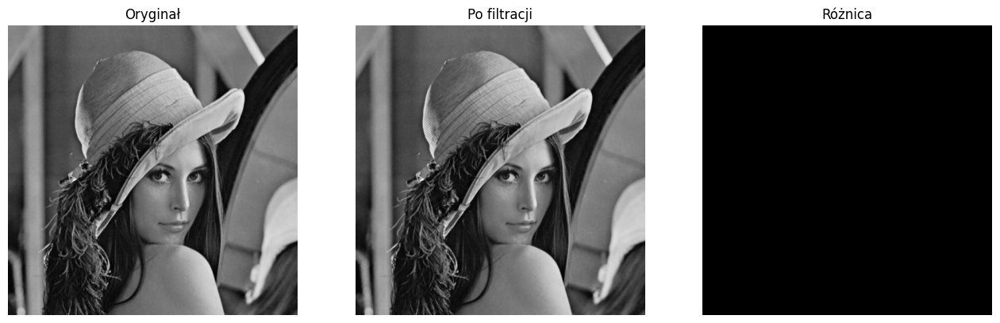

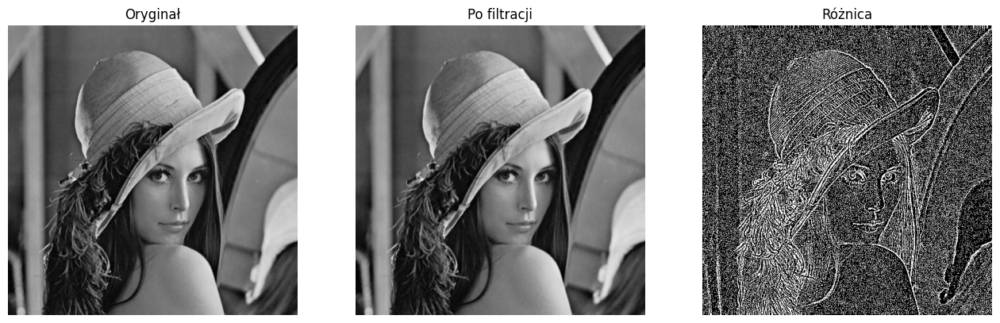

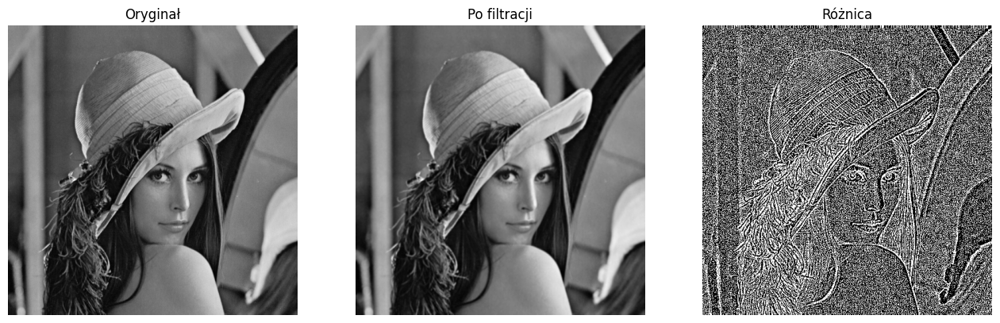

In [98]:
lena_gaus=cv2.GaussianBlur(lena,(3,3),0.2)
diff=np.abs(lena-lena_gaus)
view_3_plots(lena,lena_gaus,diff)

lena_gaus=cv2.GaussianBlur(lena,(3,3),0.5)
diff=np.abs(lena-lena_gaus)

view_3_plots(lena,lena_gaus,diff)

lena_gaus=cv2.GaussianBlur(lena,(3,3),1)
diff=np.abs(lena-lena_gaus)

view_3_plots(lena,lena_gaus,diff)

### Filtry nieliniowe -- mediana

Filtry rozmywające redukują szum, ale niekorzystnie wpływają na ostrość obrazu.
Dlatego często wykorzystuje się filtry nieliniowe - np. filtr medianowy (dla przypomnienia: mediana - środkowa wartość w posortowanym ciągu liczb).

Podstawowa różnica pomiędzy filtrami liniowymi, a nieliniowymi polega na tym, że przy filtracji liniowej na nową wartość piksela ma wpływ wartość wszystkich pikseli z otoczenia (np. uśrednianie, czasem ważone), natomiast w przypadku filtracji nieliniowej jako nowy piksel wybierana jest któraś z wartości otoczenia - według jakiegoś wskaźnika (wartość największa, najmniejsza czy właśnie mediana).


1. Wczytaj obraz _lenaSzum.png_ (losowe 10% pikseli białych lub czarnych - tzw. zakłócenia impulsowe). Przeprowadź filtrację uśredniającą z rozmiarem maski 3x3. Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Wykorzystując funkcję ``cv2.medianBlur` wykonaj filtrację medianową _lenaSzum.png_ (z rozmiarem maski $3 \times 3$). Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Która filtracja lepiej radzi sobie z tego typu szumem?

  Uwaga. Taki sam efekt da również użycie funkcji `signal.medfilt2d`.


2. Przeprowadź filtrację uśredniającą, a następnie medianową obrazu _lena.png_.
   Wyniki porównaj - dla obu wyświetl: oryginał, wynik filtracji i moduł z różnicy.
   Szczególną uwagę zwróć na ostrość i krawędzie.
   W której filtracji krawędzie zostają lepiej zachowane?

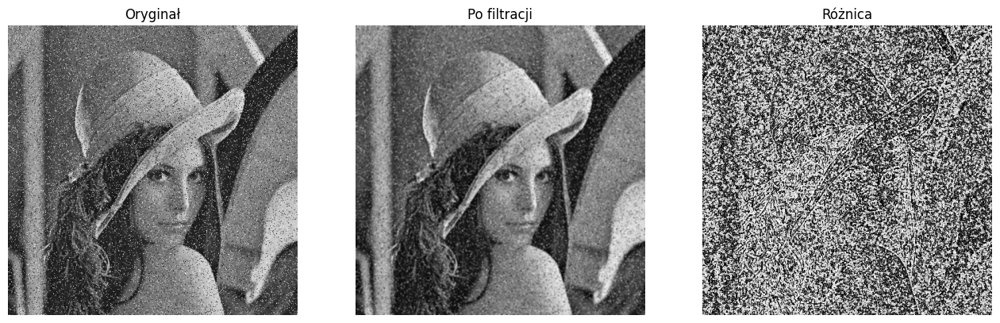

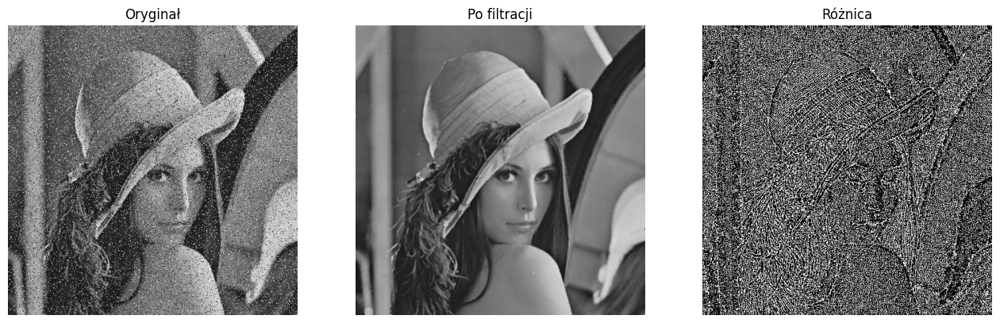

In [99]:
lena_szum = cv2.imread("lenaSzum.png", cv2.IMREAD_GRAYSCALE)
lena_gaus_szum=cv2.GaussianBlur(lena_szum,(3,3),2)
diff_szum=np.abs(lena_szum-lena_gaus_szum)
view_3_plots(lena_szum,lena_gaus_szum,diff_szum)

lena_median=cv2.medianBlur(lena_szum,3)
diff_median=np.abs(lena_szum-lena_median)
view_3_plots(lena_szum,lena_median,diff_median)

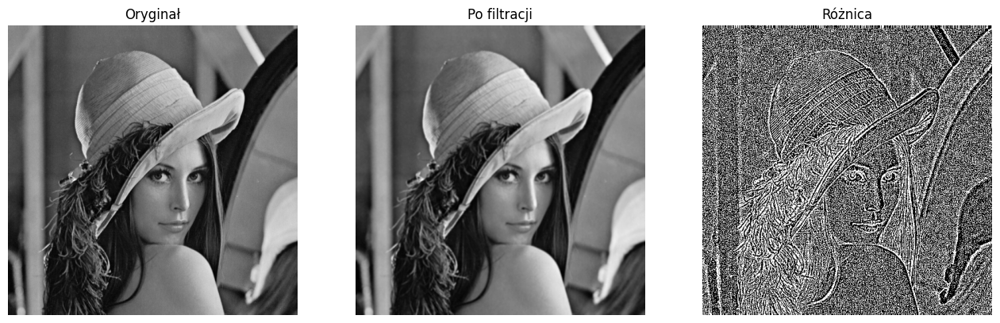

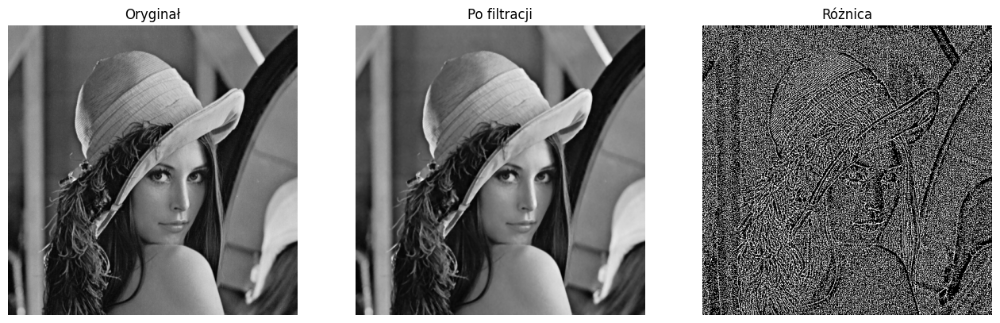

In [100]:
lena_gaus=cv2.GaussianBlur(lena,(3,3),2)
diff=np.abs(lena-lena_gaus)
view_3_plots(lena,lena_gaus,diff)

lena_median=cv2.medianBlur(lena,3)
diff_median=np.abs(lena-lena_median)
view_3_plots(lena,lena_median,diff_median)

Patrząc po różnicy wydaje się, że druga metoda zachowuje lepiej krawędzie.
Wizualnie nie ma żadnej różnicy

3. Ciekawy efekt można uzyskać wykonując filtrację medianową wielokrotnie. Określa się go mianem  posteryzacji.  W wyniku przetwarzania z obrazka usunięte zostają detale, a duże obszary uzyskują tą samą wartość jasności.  Wykonaj operację mediany $5 \times 5$ na obrazie _lena.png_ 10-krotnie. (wykorzystaj np. pętlę `for`).


Inne filtry nieliniowe:
- filtr modowy - moda (dominanta) zamiast mediany,
- filtr olimpijski - średnia z podzbioru otoczenia (bez wartości ekstremalnych),
- hybrydowy filtr medianowy - mediana obliczana osobno w różnych podzbiorach otoczenia (np. kształt ``x'',``+''), a jako wynik brana jest mediana ze zbioru wartość elementu centralnego, mediana z ``x'' i mediana z ``+'',
- filtr minimalny i maksymalny (będą omówione przy okazji operacji morfologicznych w dalszej części kursu).


Warto zdawać sobie sprawę, z szerokich możliwości dopasowywania rodzaju filtracji do konkretnego rozważanego problemu i rodzaju zaszumienia występującego na obrazie.

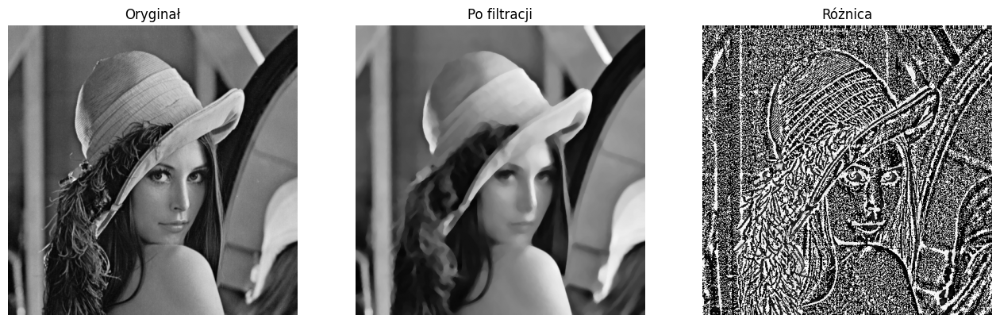

In [101]:
lena = cv2.imread("lena.png", cv2.IMREAD_GRAYSCALE)
lena_median=cv2.medianBlur(lena,5)
for i in range(9):
    lena_median=cv2.medianBlur(lena_median,5)

diff_median=np.abs(lena-lena_median)
view_3_plots(lena,lena_median,diff_median)

## Filtry liniowe górnoprzepustowe (wyostrzające, wykrywające krawędzie)

Zadaniem filtrów górnoprzepustowych jest wydobywanie z obrazu składników odpowiedzialnych za szybkie zmiany jasności - konturów, krawędzi, drobnych elementów tekstury.

### Laplasjan (wykorzystanie drugiej pochodnej obrazu)

1. Wczytaj obraz _moon.png_.

2. Wprowadź podstawową maskę laplasjanu:
\begin{equation}
M = 
\begin{bmatrix}
0 & 1& 0 \\ 1 & -4 & 1 \\ 0 & 1 & 0
\end{bmatrix}
\end{equation}

3. Przed rozpoczęciem obliczeń należy dokonać normalizacji maski - dla rozmiaru $3 \times 3$ podzielić każdy element przez 9.
   Proszę zwrócić uwagę, że nie można tu zastosować takiej samej normalizacji, jak dla filtrów dolnoprzepustowanych, gdyż skutkowałby to dzieleniem przez 0.

4. Wykonaj konwolucję obrazu z maską (`c2.filter2D`). Przed wyświetleniem, wynikowy obraz należy poddać normalizacji (występują ujemne wartości). Najczęściej wykonuje się jedną z dwóch operacji:
- skalowanie (np. poprzez dodatnie 128 do każdego z pikseli),
- moduł (wartość bezwzględna).

Wykonaj obie normalizacje. 
Na wspólnym wykresie wyświetl obraz oryginalny oraz przefiltrowany po obu normalizacjach. 

(np.float64(-0.5), np.float64(465.5), np.float64(539.5), np.float64(-0.5))

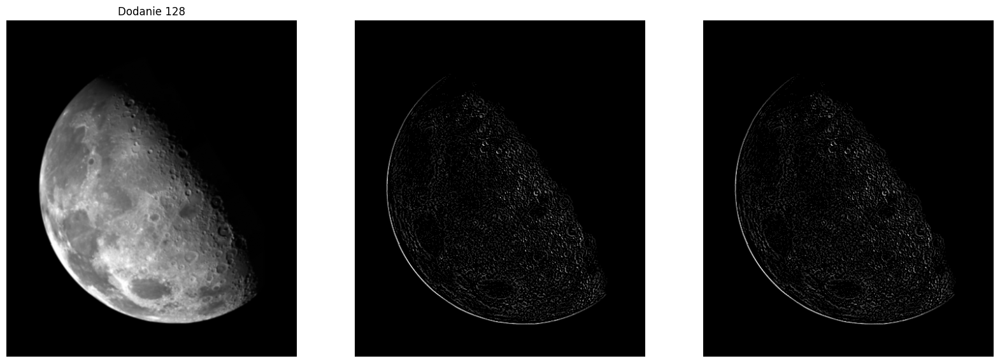

In [102]:
moon = cv2.imread("moon.png", cv2.IMREAD_GRAYSCALE)

M= np.array([[0,1,0],[1,-4,1],[0,1,0]])/9

moon_lap=cv2.filter2D(moon,-1,M)
moon_1 = np.abs(moon_lap)
moon_2 = moon_lap+128
f, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(20,20))
ax1.set_title("Oryginał")
ax1.imshow(moon, 'gray')
ax1.axis('off')
ax1.set_title("Wartość bezwzględna")
ax2.imshow(moon_1, 'gray')
ax2.axis('off')
ax1.set_title("Dodanie 128")
ax3.imshow(moon_2, 'gray')
ax3.axis('off')

7. Efekt wyostrzenia uzyskuje się po odjęciu/dodaniu (zależy do maski) rezultatu filtracji laplasjanowej i oryginalnego obrazu. Wyświetl na jednym wykresie: obraz oryginalny, sumę oryginału i wyniku filtracji oraz różnicę (bezwzględną) oryginału i wyniku filtracji.
 Uwaga. Aby uniknąć artefaktów, należy obraz wejściowy przekonwertować do formatu ze znakiem.



(np.float64(-0.5), np.float64(465.5), np.float64(539.5), np.float64(-0.5))

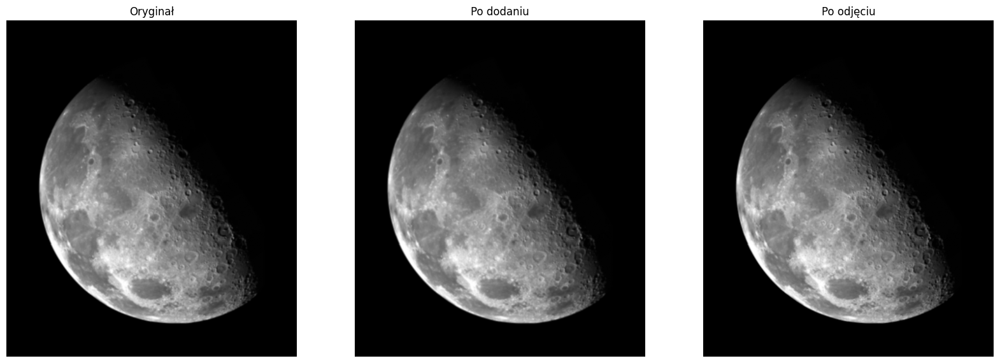

In [103]:
moon_int=moon.astype('int16')
f, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(20,20))
ax1.set_title("Oryginał")
ax1.imshow(moon_int, 'gray')
ax1.axis('off')
ax2.set_title("Po dodaniu")
ax2.imshow(moon_int+moon_lap, 'gray')
ax2.axis('off')
ax3.set_title("Po odjęciu")
ax3.imshow(np.abs(moon_int-moon_lap), 'gray')
ax3.axis('off')


In [104]:
def normalize(img,maska):
    img_filtered=cv2.filter2D(img,-1,maska)
    img_1 = np.abs(img_filtered)
    img_2 = img_filtered+128
    f, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(10,5))
    ax1.set_title("Oryginał")
    ax1.imshow(img, 'gray')
    ax1.axis('off')
    ax2.imshow(img_1, 'gray')
    ax2.set_title("Pierwszy")
    ax2.axis('off')
    ax3.set_title("Drugi")
    ax3.imshow(img_2, 'gray')
    ax3.axis('off')

### Gradienty (wykorzystanie pierwszej pochodnej obrazu)

1. Wczytaj obraz _kw.png_. Stwórz odpowiednie maski opisane w kolejnych punktach i dokonaj filtracji.
2. Wykorzystując gradient Robertsa przeprowadź detekcję krawędzi - poprzez wykonanie konwolucji obrazu z daną maską:
\begin{equation}
R1 = \begin{bmatrix} 0 & 0 & 0 \\ -1 & 0 & 0 \\ 0 & 1 & 0 \end{bmatrix}   
R2 = \begin{bmatrix} 0 & 0 & 0 \\ 0 & 0 & -1 \\ 0 & 1 & 0 \end{bmatrix}
\end{equation}

Wykorzystaj stworzony wcześniej kod (przy laplasjanie) - dwie metody normalizacji oraz sposób wyświetlania.

3. Analogicznie przeprowadź detekcję krawędzi za pomocą gradientu Prewitta (pionowy i poziomy)
\begin{equation}
P1 = \begin{bmatrix} -1 & 0 & 1 \\ -1 & 0 & 1 \\ -1 & 0 & 1 \end{bmatrix}   
P2 = \begin{bmatrix} -1 & -1 & -1 \\ 0 & 0 & 0 \\ 1 & 1 & 1 \end{bmatrix}
\end{equation}

4. Podobnie skonstruowany jest gradient Sobela (występuje osiem masek, zaprezentowane są dwie ``prostopadłe''):
\begin{equation}
S1 = \begin{bmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{bmatrix}   
S2 = \begin{bmatrix} -1 & -2 & -1 \\ 0 & 0 & 0 \\ 1 & 2 & 1 \end{bmatrix}
\end{equation}

Przeprowadź detekcję krawędzi za pomocą gradientu Sobela. 

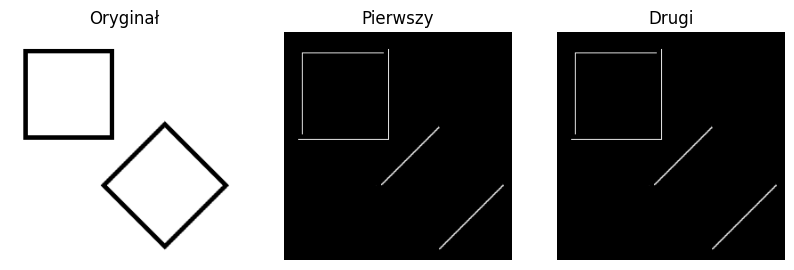

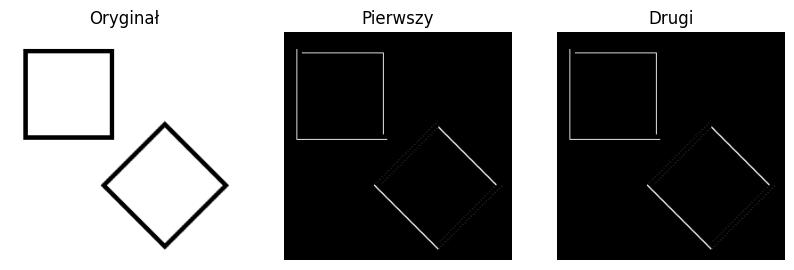

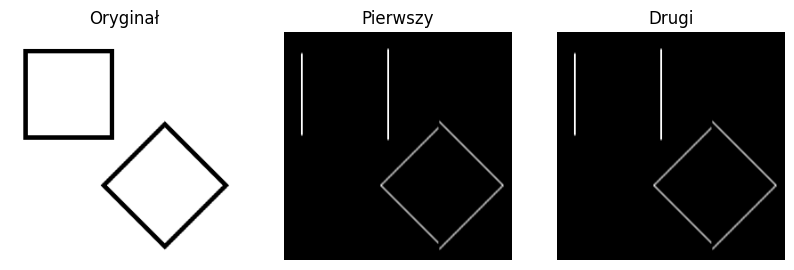

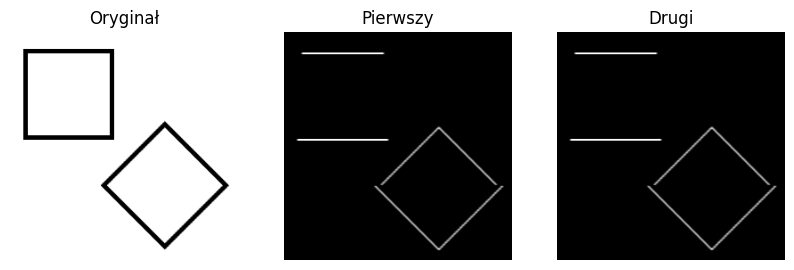

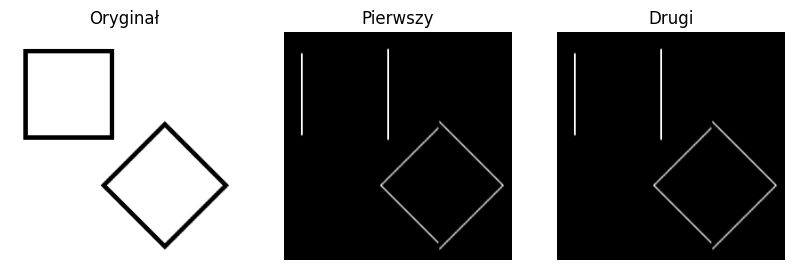

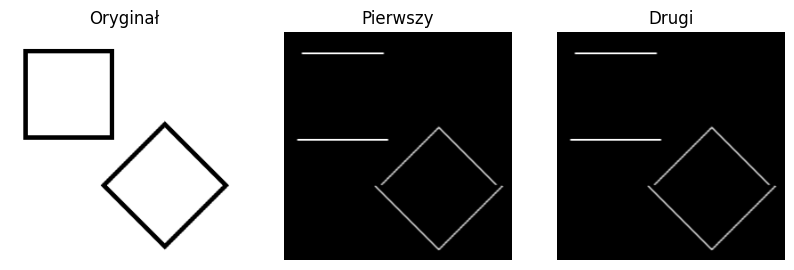

In [105]:
kw = cv2.imread("kw.png", cv2.IMREAD_GRAYSCALE)

R1=np.array([[0,0,0],[-1,0,0],[0,1,0]])/9
R2=np.array([[0,0,0],[0,0,-1],[0,1,0]])/9
P1=np.array([[-1,0,1],[-1,0,1],[-1,0,1]])/9
P2=np.array([[-1,-1,-1],[0,0,0],[1,1,1]])/9
S1=np.array([[-1,0,1],[-2,0,2],[-1,0,1]])/9
S2=np.array([[-1,-2,-1],[0,0,0],[1,2,1]])/9

normalize(kw,R1)
normalize(kw,R2)
normalize(kw,P1)
normalize(kw,P2)
normalize(kw,S1)
normalize(kw,S2)

5. Na podstawie dwóch ortogonalnych masek np. Sobela można stworzyć tzw. filtr kombinowany - pierwiastek kwadratowy z sumy kwadratów gradientów:
\begin{equation}
OW = \sqrt{(O * S1)^2 + (O * S2)^2}
\end{equation}
gdzie:  $OW$ - obraz wyjściowy, $O$ - obraz oryginalny (wejściowy), $S1,S2$ - maski Sobela, $*$ - operacja konwolucji.

Zaimplementuj filtr kombinowany.

Uwaga. Proszę zwrócić uwagę na konieczność zmiany formatu danych obrazu wejściowego - na typ znakiem



In [106]:
kw = cv2.imread("kw.png", cv2.IMREAD_GRAYSCALE)
kw = kw.astype('int16')

X1 = cv2.filter2D(kw, -1, S1)
X2 = cv2.filter2D(kw, -1, S2)

XD = np.power(X1, 2)
XDD = np.power(X2, 2)

OW = np.sqrt(XD + XDD)



6. Istnieje alternatywna wersja filtra kombinowanego, która zamiast pierwiastka z sumy kwadratów wykorzystuje sumę modułów (prostsze obliczenia). 
Zaimplementuj tę wersję. 

In [107]:
kw = cv2.imread("kw.png", cv2.IMREAD_GRAYSCALE)
kw=kw.astype('int16')
X1=cv2.filter2D(kw,-1,S1)
X2=cv2.filter2D(kw,-1,S2)


X1_norm = np.abs(X1)
X2_norm = np.abs(X2)

OW=(X1+X2)



7. Wczytaj plik _jet.png_ (zamiast _kw.png_).
Sprawdź działanie obu wariantów filtracji kombinowanej.

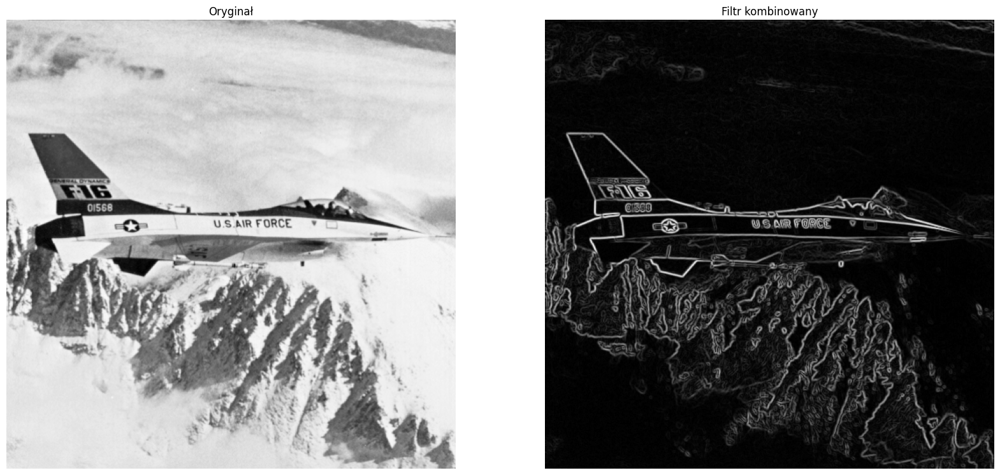

(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

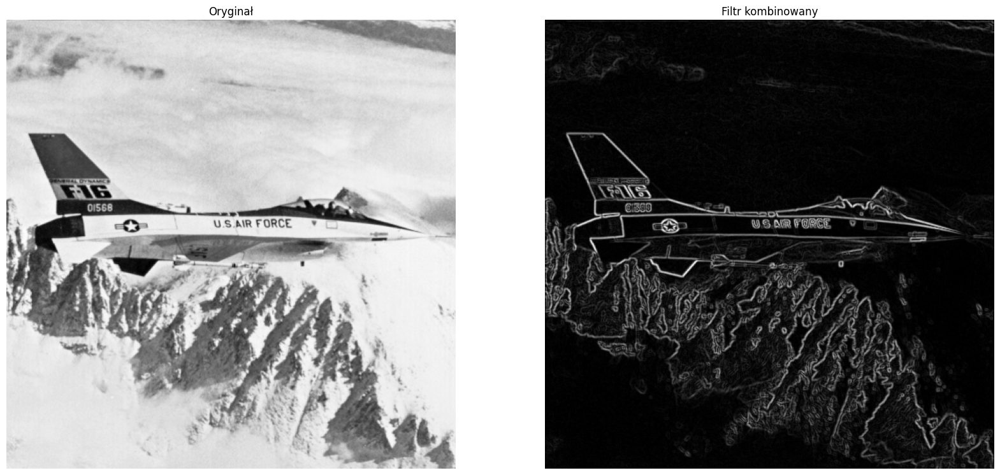

In [108]:
jet = cv2.imread("jet.png", cv2.IMREAD_GRAYSCALE)
jet=jet.astype('int16')
X1=cv2.filter2D(jet,-1,S1)
X2=cv2.filter2D(jet,-1,S2)

X1_norm = np.abs(X1)
X2_norm = np.abs(X2)
    
X1_power=np.power(X1_norm,2)
X2_power=np.power(X2_norm,2)

OW=np.sqrt(X1_power+X2_power)

f, (ax1,ax2) = plt.subplots(1,2,figsize=(20,20))
ax1.set_title("Oryginał")
ax1.imshow(jet, 'gray')
ax1.axis('off')

ax2.set_title("Filtr kombinowany")
ax2.imshow(OW, 'gray')
ax2.axis('off')
plt.show()





OW_2=(X1_norm+X2_norm)


f, (ax1,ax2) = plt.subplots(1,2,figsize=(20,20))
ax1.set_title("Oryginał")
ax1.imshow(jet, 'gray')
ax1.axis('off')

ax2.set_title("Filtr kombinowany")
ax2.imshow(OW_2, 'gray')
ax2.axis('off')